In [4]:
import pandas as pd
import numpy as np
import skimage.io as io

In [5]:
df = pd.read_csv(r"/content/drive/My Drive/深度專題/Tom_adj.csv")
df = df.iloc[:7000, 1:11]
df = np.array(df)
df.shape

(7000, 10)

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
import torch
import torch.utils.data as Data
import numpy as np

In [8]:
import matplotlib.pyplot as plt

In [9]:
torch.cuda.is_available()

True

In [10]:
import matplotlib.image as mpimg

In [11]:
import os
imagelist = os.listdir(r"/content/drive/My Drive/深度專題/Tom_img")
imagelist.sort(key= lambda x:x[12:-6])
imagelist = np.array(imagelist)
print(imagelist[0])

Tom_Holland_000001_0.png


In [15]:
t = []
for i in imagelist:
  img = io.imread(r"/content/drive/My Drive/深度專題/Tom_img/"+i)
  t.append(img)
  # print(i)
  #plt.imshow(img)
  #plt.show()

T = np.array(t)

In [16]:
import cv2

In [17]:
T_gray = []
for i in range(7000):
  T_gray_single = cv2.cvtColor(T[i], cv2.COLOR_BGR2GRAY)
  T_gray.append(T_gray_single)
T_gray = np.array(T_gray)
print(T_gray.shape)

(7000, 256, 256)


In [18]:
nr, nc = T_gray[0].shape[:2]
nr, nc = nr//4, nc//4
print(nr, nc)
T_rescale = []
for i in range(len(T_gray)):
  img = cv2.resize(T_gray[i], (nr, nc), interpolation = cv2.INTER_LINEAR)
  T_rescale.append(img)
T_rescale = np.array(T_rescale)
print(T_rescale.shape)

64 64
(7000, 64, 64)


In [19]:
class MyDataset(Data.Dataset): 
  def __init__(self, f, l, train=True, transform=None):
    if train == True:
      f = f[:5600]
      l = l[:5600]
    else:
      f = f[5600:]
      l = l[5600:]

    self.features = f
    self.labels = l
    self.transform = transform

  def __len__(self):
    return len(self.labels)
  
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
      idx = idx.tolist()
    
    X = self.features[idx]
    Y = self.labels[idx]
    
    if self.transform:
      X = self.transform(X)
      Y = self.transform(Y)
    
    return X, Y

In [20]:
def toTensor(x):
  return torch.tensor(x)

In [21]:
T_rescale = np.expand_dims(T_rescale, axis=1)
T_rescale.shape

(7000, 1, 64, 64)

In [22]:
train_dataset = MyDataset(T_rescale, df, train=True, transform=toTensor)
test_dataset = MyDataset(T_rescale, df, train=False, transform=toTensor)

In [23]:
train_dataset[0]

(tensor([[[ 89,  56,  50,  ..., 176, 167, 123],
          [ 85,  49,  49,  ..., 175, 162, 113],
          [ 79,  50,  48,  ..., 176, 159, 106],
          ...,
          [ 63,  61,  57,  ...,  21,  21,  20],
          [ 59,  54,  47,  ...,  23,  21,  20],
          [ 53,  49,  41,  ...,  37,  25,  22]]], dtype=torch.uint8),
 tensor([ 85,  85, 174,  85, 133, 136,  90, 172, 162, 174]))

In [24]:
# input_size = 64*64*3 #input有28*28個node
# hidden_size = 100 #中間隱藏層的node會遞減,減少他的維度,只有第一層隱藏層的維度可能會大於輸入層 #隱藏層數量
# num_classes = 10 #最後一層剩10個node
# num_epoch = 50
# batch_size = 10 #最好可以整除資料大小
# learning_rate = 0.001

In [25]:
input_size = 64*64 
hidden_size = 100 
num_classes = 10
num_epoch = 50
batch_size = 10 
learning_rate = 0.0001

In [26]:
train_loader = Data.DataLoader(dataset=train_dataset,
                batch_size=batch_size,
                shuffle=True)
test_loader = Data.DataLoader(dataset=test_dataset,
                batch_size=batch_size,
                shuffle=False)

In [27]:
test_dataset.features.shape, test_dataset.labels.shape

((1400, 1, 64, 64), (1400, 10))

In [28]:
print(T_rescale.shape)
print(df.shape)

(7000, 1, 64, 64)
(7000, 10)


In [29]:
import torch.nn as nn

In [30]:
class Model_cnn(nn.Module):
  def __init__(self): 
    super(Model_cnn, self).__init__()
    self.conv = nn.Sequential(
        
        nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1),
        nn.ReLU(),
        nn.Conv2d(32, 64, kernel_size=3,stride=1, padding=1), 
        nn.ReLU(),
        nn.Conv2d(64, 128, kernel_size=3,stride=1, padding=1), 
        nn.ReLU(),
        nn.MaxPool2d(stride=2, kernel_size=2),
        nn.MaxPool2d(stride=2, kernel_size=2)
    )
    self.dense = nn.Sequential(
        nn.Linear(16*16*128, 1024),
        nn.ReLU(),
        nn.Linear(1024, 512),
        nn.ReLU(),
        nn.Linear(512, 10)
    )
  
  def forward(self, x): 
    out = self.conv(x)
    out = out.view(-1, 16*16*128)
    out = self.dense(out)
    return out

In [31]:
model_cnn = Model_cnn()
model_cnn.cuda()

Model_cnn(
  (conv): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (dense): Sequential(
    (0): Linear(in_features=32768, out_features=1024, bias=True)
    (1): ReLU()
    (2): Linear(in_features=1024, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=10, bias=True)
  )
)

In [32]:
import torch.optim as opt

In [33]:
loss_fn = nn.MSELoss()
optimizer = opt.Adam(model_cnn.parameters(), lr=learning_rate) 

In [34]:
from torch.autograd import Variable

In [35]:
for epoch in range(num_epoch):
  for i, (features, labels) in enumerate(train_loader):
    features = Variable(features.type(torch.cuda.FloatTensor)) 
    labels = Variable(labels.type(torch.cuda.FloatTensor))
    optimizer.zero_grad()
    outputs = model_cnn(features)
    loss = loss_fn(outputs, labels.float()) 
    loss.backward()
    optimizer.step()
    if (i+1)%100 == 0:
      print("Epoch:%d, Batch:%d, Loss:%.4f" %(epoch+1, i+1, loss.data))

Epoch:1, Batch:100, Loss:373.9791
Epoch:1, Batch:200, Loss:359.7441
Epoch:1, Batch:300, Loss:610.0841
Epoch:1, Batch:400, Loss:493.5739
Epoch:1, Batch:500, Loss:324.6013
Epoch:2, Batch:100, Loss:138.6620
Epoch:2, Batch:200, Loss:30.7604
Epoch:2, Batch:300, Loss:39.2114
Epoch:2, Batch:400, Loss:46.4545
Epoch:2, Batch:500, Loss:584.5635
Epoch:3, Batch:100, Loss:68.8159
Epoch:3, Batch:200, Loss:53.5504
Epoch:3, Batch:300, Loss:96.4413
Epoch:3, Batch:400, Loss:46.2188
Epoch:3, Batch:500, Loss:41.3993
Epoch:4, Batch:100, Loss:106.0875
Epoch:4, Batch:200, Loss:13.2229
Epoch:4, Batch:300, Loss:14.2274
Epoch:4, Batch:400, Loss:27.1264
Epoch:4, Batch:500, Loss:47.9172
Epoch:5, Batch:100, Loss:10.2603
Epoch:5, Batch:200, Loss:23.5877
Epoch:5, Batch:300, Loss:38.1019
Epoch:5, Batch:400, Loss:6.7983
Epoch:5, Batch:500, Loss:15.9053
Epoch:6, Batch:100, Loss:24.9943
Epoch:6, Batch:200, Loss:8.6180
Epoch:6, Batch:300, Loss:248.4321
Epoch:6, Batch:400, Loss:56.0278
Epoch:6, Batch:500, Loss:73.7834
Epo

In [36]:
correct = 0
correct_LE = 0
correct_RE = 0
correct_N = 0
correct_LM = 0
correct_RM = 0
total = 0
t = []
t_label = []
batch_of_first = []
batch_of_first_label = []
for features, labels in test_loader:
  # print(features.shape)
  # print(labels.shape)
  # features = Variable(features.type(torch.cuda.FloatTensor))
  outputs = model_cnn(Variable(features.type(torch.cuda.FloatTensor)))
  outputs = outputs.cpu()

  temp = outputs.detach().numpy()
  batch_of_first.append(temp[0])

  temp_label = labels.detach().numpy()
  batch_of_first_label.append(temp_label[0])

  for i in range(0, 10):
    for j in range(0, 10, 2):
      correct += (torch.sqrt(((outputs[i][j] - labels[i][j])**2+(outputs[i][j+1] - labels[i][j+1])**2))<10).sum()
      # print(correct)
    correct_LE += (torch.sqrt(((outputs[i][0] - labels[i][0])**2+(outputs[i][1] - labels[i][1])**2))<10).sum()
    correct_RE += (torch.sqrt(((outputs[i][2] - labels[i][2])**2+(outputs[i][3] - labels[i][3])**2))<10).sum()
    correct_N += (torch.sqrt(((outputs[i][4] - labels[i][4])**2+(outputs[i][5] - labels[i][5])**2))<10).sum()
    correct_LM += (torch.sqrt(((outputs[i][6] - labels[i][6])**2+(outputs[i][7] - labels[i][7])**2))<10).sum()
    correct_RM += (torch.sqrt(((outputs[i][8] - labels[i][8])**2+(outputs[i][9] - labels[i][9])**2))<10).sum()

  total += labels.size(0)

print("Accuracy:%.3f%%" %(100.0* float(correct)/float(total*5)))
print("Left Eye Accuracy:%.3f%%" %(100.0* float(correct_LE)/float(total)))
print("Right Eye Accuracy:%.3f%%" %(100.0* float(correct_RE)/float(total)))
print("Nose Accuracy:%.3f%%" %(100.0* float(correct_N)/float(total)))
print("Left Mouth Accuracy:%.3f%%" %(100.0* float(correct_LM)/float(total)))
print("Right Mouth Accuracy:%.3f%%" %(100.0* float(correct_RM)/float(total)))

Accuracy:79.600%
Left Eye Accuracy:88.286%
Right Eye Accuracy:81.286%
Nose Accuracy:81.643%
Left Mouth Accuracy:71.714%
Right Mouth Accuracy:75.071%


In [37]:
batch_of_first = np.array(batch_of_first)
print(batch_of_first)

batch_of_first_label = np.array(batch_of_first_label)
print(batch_of_first_label.shape)

for i in range(len(batch_of_first)):
  t_out = batch_of_first[i].reshape(-1, 2)
  t.append(t_out)
t = np.array(t)
print(t.shape)

for i in range(len(batch_of_first_label)):
  t_out_label = batch_of_first_label[i].reshape(-1, 2)
  t_label.append(t_out_label)
t_label = np.array(t_label)
print(t_label.shape)

[[ 86.7385    88.79734  172.98944  ... 170.47447  162.47484  174.05292 ]
 [ 92.26514   84.586365 177.6177   ... 179.17517  158.084    180.5733  ]
 [ 90.861305  84.09493  177.652    ... 175.86002  160.0047   177.54367 ]
 ...
 [ 83.939064  86.75233  168.94672  ... 173.68372  160.5056   173.87141 ]
 [ 85.15447   89.00382  174.05222  ... 176.30937  158.87439  176.56451 ]
 [ 84.498055  86.64669  173.03433  ... 176.5743   156.27768  175.90361 ]]
(140, 10)
(140, 5, 2)
(140, 5, 2)


In [38]:
imagelist.shape

(7000,)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  del sys.path[0]


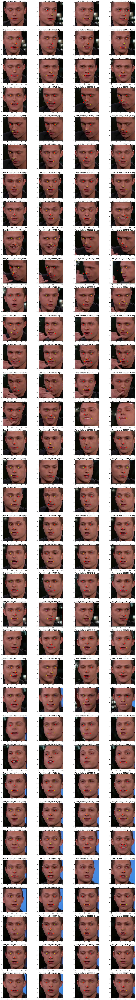

In [39]:
img_name = []
for i in range(5600, 7000, 10):
  img_name_temp = imagelist[i]
  img_name.append(img_name_temp)
# img_name = np.array(img_name)
# print(img_name)

f, a = plt.subplots(35, 4, figsize=(30, 220))
for i in range(140):
  image = io.imread(os.path.join(r"/content/drive/My Drive/深度專題/Tom_img/{}".format(img_name[i])))
  a[(i//4)][(i%4)].imshow(image)
  a[(i//4)][(i%4)].scatter(t[i][:, 0], t[i][:, 1], s=80, marker='o', c='R')
  a[(i//4)][(i%4)].scatter(t_label[i][:, 0], t_label[i][:, 1], s=80, marker='x', c='Y')
  a[(i//4)][(i%4)].set_title(img_name[i], fontsize=20)
plt.draw()
plt.show()

In [40]:
# img_name = []
# for i in range(0, 7000, 10):
#   img_name_temp = imagelist[i]
#   img_name.append(img_name_temp)
# # img_name = np.array(img_name)
# # print(img_name)

# f, a = plt.subplots(25, 4, figsize=(30, 220))
# for i in range(0, 700, 7):
#   image = io.imread(os.path.join(r"/content/drive/My Drive/Tom/Tom_imgs/{}".format(img_name[i])))
#   a[(i//28)][(i//7-4*(i//28))].imshow(image)
#   a[(i//28)][(i//7-4*(i//28))].scatter(t[i][:, 0], t[i][:, 1], s=80, marker='o', c='R')
#   a[(i//28)][(i//7-4*(i//28))].scatter(t_label[i][:, 0], t_label[i][:, 1], s=80, marker='x', c='Y')
#   a[(i//28)][(i//7-4*(i//28))].set_title(img_name[i], fontsize=20)
# plt.draw()
# plt.show()